In [19]:
import pandas as pd
import re
import plotly.express as px
from autoviz.AutoViz_Class import AutoViz_Class
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
%matplotlib inline

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


# Assignment Part 1 - EDA

a) Assignment 1 is to do a complete dataset EDA in colab (preferably using D3.js visualizations)


Pick a complex dataset from kaggle

Please push to limits and demonstrate advanced d3.js visualizations

You can look at EDA grandmastery examples and inspire by them

Total marks - 50% of assignment

check my class video for inspirations



In [2]:
israel_v_palestine = pd.read_csv('Israel-Palestine.csv')

In [3]:
israel_v_palestine.columns

Index(['Year', 'Country', 'GDP (in USD)', 'Population', 'GDP Growth Rate (%)',
       'Fertility Rate', 'Infant Mortality Rate (per 1,000 live births)',
       'Maternal Mortality Rate (per 100,000 live births)',
       'Agricultural Output (in USD)', 'Active Military Personnel',
       'Reserve Military Personnel', 'Literacy Rate (%)', 'IT Output (in USD)',
       'Number of Tanks', 'Number of Submarines',
       'Number of Armoured Vehicles'],
      dtype='object')

## Data Cleaning

In [4]:
# Renaming columns to facilitate manipulation
israel_v_palestine.rename(columns = {
    'GDP (in USD)': 'GDP_USD_BILLIONS',
    'GDP Growth Rate (%)': 'GDP_Growth_Rate',
    'Fertility Rate': 'Fertility_Rate',
    'Infant Mortality Rate (per 1,000 live births)': 'Infant_Mortality_Rate',
    'Maternal Mortality Rate (per 100,000 live births)' : 'Maternal_Mortality_Rate',
    'Agricultural Output (in USD)': 'Agricultural_Output_USD',
    'Active Military Personnel': 'Active_Military_Personnel',
    'Reserve Military Personnel': 'Reserve_Military_Personnel',
    'Literacy Rate (%)': 'Literacy_Rate',
    'IT Output (in USD)': 'IT_Output_USD',
    'Number of Tanks': 'Number_of_Tanks',
    'Number of Submarines': 'Number_of_Submarines',
    'Number of Armoured Vehicles': 'Number_of_Armoured_Vehicles'
}, inplace=True)

In [5]:
israel_v_palestine['GDP_USD_BILLIONS'] = israel_v_palestine.GDP_USD_BILLIONS.apply(lambda x: float(re.findall(r'[0-9.]+', x)[0]))

In [6]:
israel_v_palestine.columns

Index(['Year', 'Country', 'GDP_USD_BILLIONS', 'Population', 'GDP_Growth_Rate',
       'Fertility_Rate', 'Infant_Mortality_Rate', 'Maternal_Mortality_Rate',
       'Agricultural_Output_USD', 'Active_Military_Personnel',
       'Reserve_Military_Personnel', 'Literacy_Rate', 'IT_Output_USD',
       'Number_of_Tanks', 'Number_of_Submarines',
       'Number_of_Armoured_Vehicles'],
      dtype='object')

In [7]:
israel_v_palestine.head()

,Year,Country,GDP_USD_BILLIONS,Population,GDP_Growth_Rate,Fertility_Rate,Infant_Mortality_Rate,Maternal_Mortality_Rate,Agricultural_Output_USD,Active_Military_Personnel,Reserve_Military_Personnel,Literacy_Rate,IT_Output_USD,Number_of_Tanks,Number_of_Submarines,Number_of_Armoured_Vehicles
0,2000,Israel,132.02,"6,049,000",5.18,2.89,5.0,7.2,5.71 billion,"168,000","445,000",97.1,6.78 billion,"2,760",3.0,"10,760"
1,2000,Palestine,4.56,"3,374,000",5.33,5.36,24.6,26.0,880 million,NaN,NaN,90.3,0.115 billion,NaN,NaN,NaN
2,2001,Israel,131.02,"6,165,000",-0.47,2.89,4.8,6.7,5.17 billion,"166,500","445,000",97.5,6.89 billion,"2,791",3.0,"10,814"
3,2001,Palestine,4.59,"3,400,000",-50.00,5.22,22.5,24.4,925 million,NaN,NaN,90.8,0.122 billion,NaN,NaN,NaN
4,2002,Israel,126.64,"6,263,000",-0.35,2.98,4.6,5.9,4.76 billion,"163,000","375,000",97.9,7.02 billion,"2,821",3.0,"10,885"


In [8]:
israel = israel_v_palestine.where(israel_v_palestine.Country == 'Israel').dropna(how='all')

In [9]:
palestine = israel_v_palestine.where(israel_v_palestine.Country == 'Palestine').dropna(how='all')

In [10]:
palestine.shape

(22, 16)

In [11]:
israel.shape

(22, 16)

## Gross Domestic Product

In [12]:
fig_palestine_gdp = px.line(palestine, x = 'Year', y = 'GDP_USD_BILLIONS', title='Palestine')
fig_israel_gdp = px.line(israel, x = 'Year', y = 'GDP_USD_BILLIONS', title='Israel')
gross_fig = make_subplots(rows=1, cols=2)
gross_fig.add_trace(fig_palestine_gdp.data[0], row=1, col=1)
gross_fig.add_trace(fig_israel_gdp.data[0], row=1, col=2)
gross_fig.update_layout(title_text="Palestine (Left) and Israel (Right)", showlegend=False)
gross_fig.update_xaxes(title_text="Year", row=1, col=1)
gross_fig.update_yaxes(title_text="GDP in Billions", row=1, col=1)
gross_fig.update_xaxes(title_text="Year", row=1, col=2)
gross_fig.update_yaxes(title_text="GDP in Billions", row=1, col=2)
iplot(gross_fig, filename='GDP in Billion')

## Population

In [13]:
fig_palestine_gdp = px.line(palestine, x = 'Year', y = 'Population', title='Palestine')
fig_israel_gdp = px.line(israel, x = 'Year', y = 'Population', title='Israel')
gross_fig = make_subplots(rows=1, cols=2)
gross_fig.add_trace(fig_palestine_gdp.data[0], row=1, col=1)
gross_fig.add_trace(fig_israel_gdp.data[0], row=1, col=2)
gross_fig.update_layout(title_text="Palestine (Left) and Israel (Right)", showlegend=False)
gross_fig.update_xaxes(title_text="Year", row=1, col=1)
gross_fig.update_yaxes(title_text="Population", row=1, col=1)
gross_fig.update_xaxes(title_text="Year", row=1, col=2)
gross_fig.update_yaxes(title_text="Population", row=1, col=2)
iplot(gross_fig, filename='GDP in Billion')

## Infant Mortality Rate

In [14]:
fig_palestine_gdp = px.line(palestine, x = 'Year', y = 'Infant_Mortality_Rate', title='Palestine')
fig_israel_gdp = px.line(israel, x = 'Year', y = 'Infant_Mortality_Rate', title='Israel')
gross_fig = make_subplots(rows=1, cols=2)
gross_fig.add_trace(fig_palestine_gdp.data[0], row=1, col=1)
gross_fig.add_trace(fig_israel_gdp.data[0], row=1, col=2)
gross_fig.update_layout(title_text="Palestine (Left) and Israel (Right)", showlegend=False)
gross_fig.update_xaxes(title_text="Year", row=1, col=1)
gross_fig.update_yaxes(title_text="Infant Mortality Rate", row=1, col=1)
gross_fig.update_xaxes(title_text="Year", row=1, col=2)
gross_fig.update_yaxes(title_text="Infant Mortality Rate", row=1, col=2)
iplot(gross_fig, filename='GDP in Billion')

## Maternal Mortality Rate

In [15]:
fig_palestine_gdp = px.line(palestine, x = 'Year', y = 'Maternal_Mortality_Rate', title='Palestine')
fig_israel_gdp = px.line(israel, x = 'Year', y = 'Maternal_Mortality_Rate', title='Israel')
gross_fig = make_subplots(rows=1, cols=2)
gross_fig.add_trace(fig_palestine_gdp.data[0], row=1, col=1)
gross_fig.add_trace(fig_israel_gdp.data[0], row=1, col=2)
gross_fig.update_layout(title_text="Palestine (Left) and Israel (Right)", showlegend=False)
gross_fig.update_xaxes(title_text="Year", row=1, col=1)
gross_fig.update_yaxes(title_text="Maternal Mortality Rate", row=1, col=1)
gross_fig.update_xaxes(title_text="Year", row=1, col=2)
gross_fig.update_yaxes(title_text="Maternal Mortality Rate", row=1, col=2)
iplot(gross_fig, filename='GDP in Billion')

## Active Military Personnel - No Data For Palestine

In [16]:
fig_palestine_gdp = px.line(palestine, x = 'Year', y = 'Active_Military_Personnel', title='Palestine')
fig_israel_gdp = px.line(israel, x = 'Year', y = 'Active_Military_Personnel', title='Israel')
gross_fig = make_subplots(rows=1, cols=2)
gross_fig.add_trace(fig_palestine_gdp.data[0], row=1, col=1)
gross_fig.add_trace(fig_israel_gdp.data[0], row=1, col=2)
gross_fig.update_layout(title_text="Palestine (Left) and Israel (Right)", showlegend=False)
gross_fig.update_xaxes(title_text="Year", row=1, col=1)
gross_fig.update_yaxes(title_text="Active Military Personnel", row=1, col=1)
gross_fig.update_xaxes(title_text="Year", row=1, col=2)
gross_fig.update_yaxes(title_text="Active Military Personnel", row=1, col=2)
iplot(gross_fig, filename='GDP in Billion')

## Assignment Part 2 - AutoEDA

b) Assignment 2 - Auto EDA with your favorite tool

Pick your favorite kaggle data set and favorite auto eda tool (like pandas profiler or sweetviz etc.,.)

Do auto eda using one of the tools i discussed in the class which is your favorite. make it very appealing for viewers

Total marks : 25%

check my class video for inspirations

In [17]:
# use pycaret to run eda on nyc_sat_scores
nyc_sat_scores = pd.read_csv('scores.csv')

In [23]:
nyc_sat_scores.columns

Index(['School ID', 'School Name', 'Borough', 'Building Code',
       'Street Address', 'City', 'State', 'Zip Code', 'Latitude', 'Longitude',
       'Phone Number', 'Start Time', 'End Time', 'Student Enrollment',
       'Percent White', 'Percent Black', 'Percent Hispanic', 'Percent Asian',
       'Average Score (SAT Math)', 'Average Score (SAT Reading)',
       'Average Score (SAT Writing)', 'Percent Tested'],
      dtype='object')

In [18]:
# fill in all the missing values in each column with the mean of each column
nyc_sat_scores.fillna(nyc_sat_scores.mean(), inplace=True)

/var/folders/b8/b_prs9t152qc96jlgz5zhwt00000gn/T/ipykernel_93058/930839125.py:2: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



In [20]:
AV = AutoViz_Class()

Shape of your Data Set loaded: (435, 22)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  5
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  5
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  7
    Number of NLP String Columns =  1
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  1
    21 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables

################ Regression problem #####################


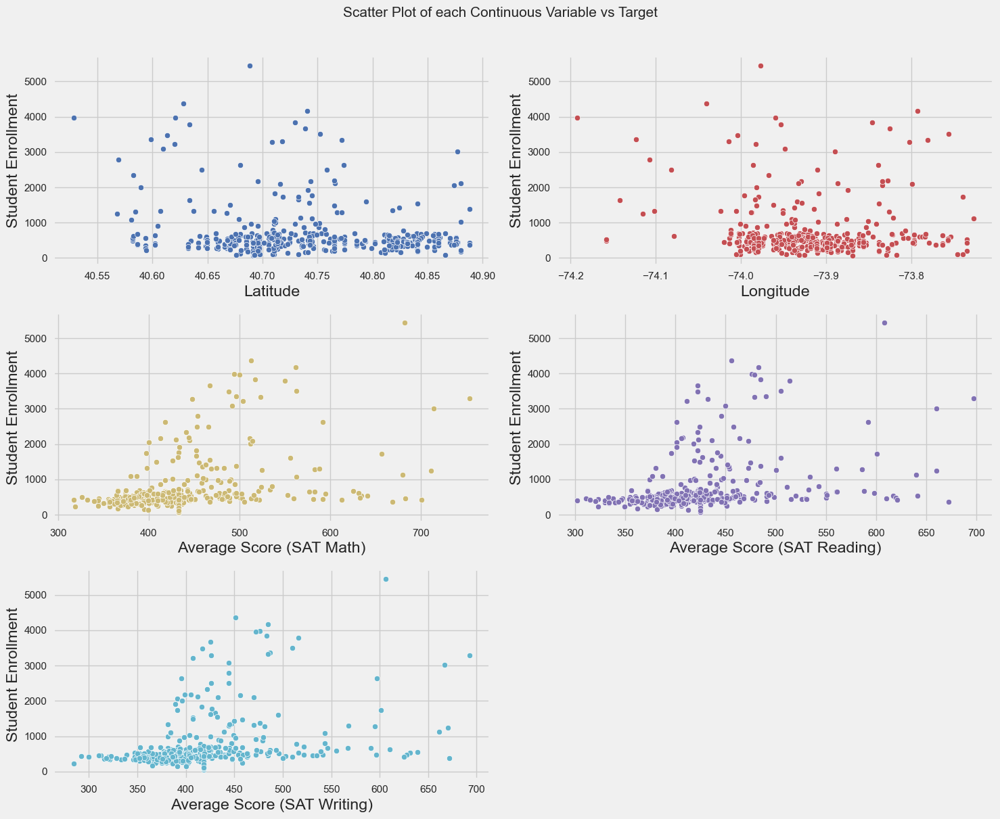

Number of All Scatter Plots = 15


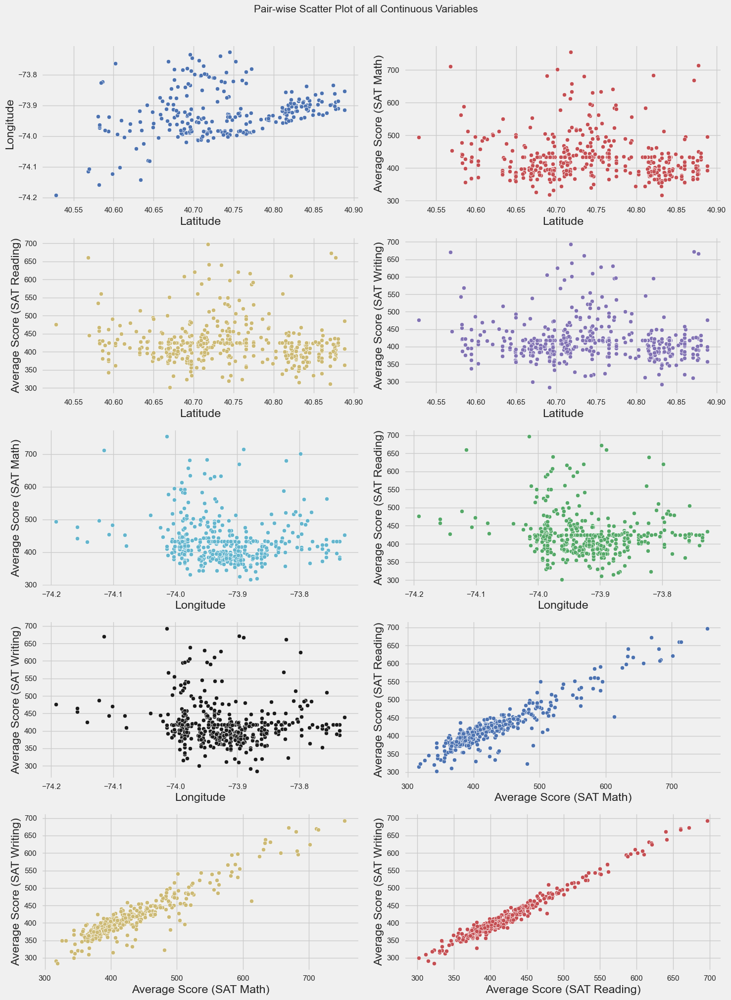

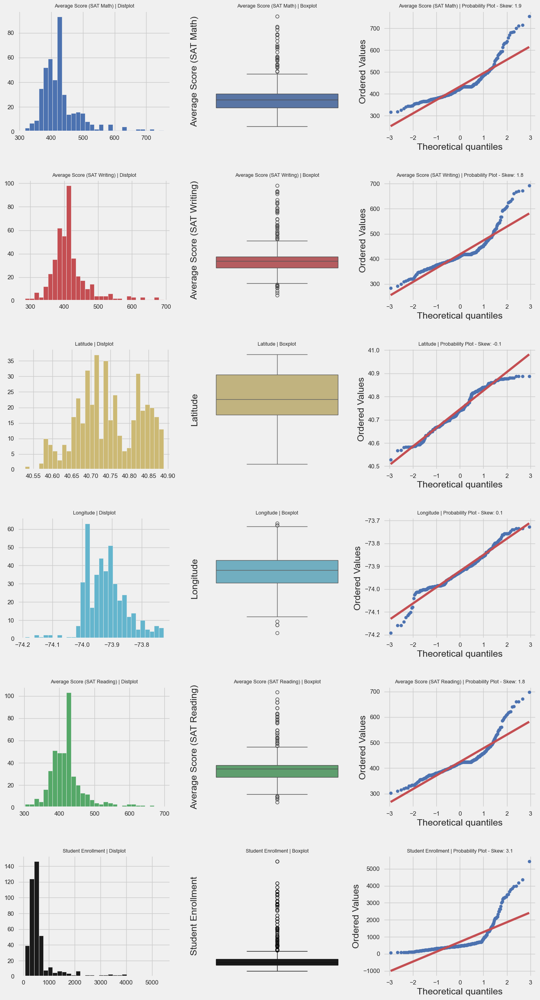

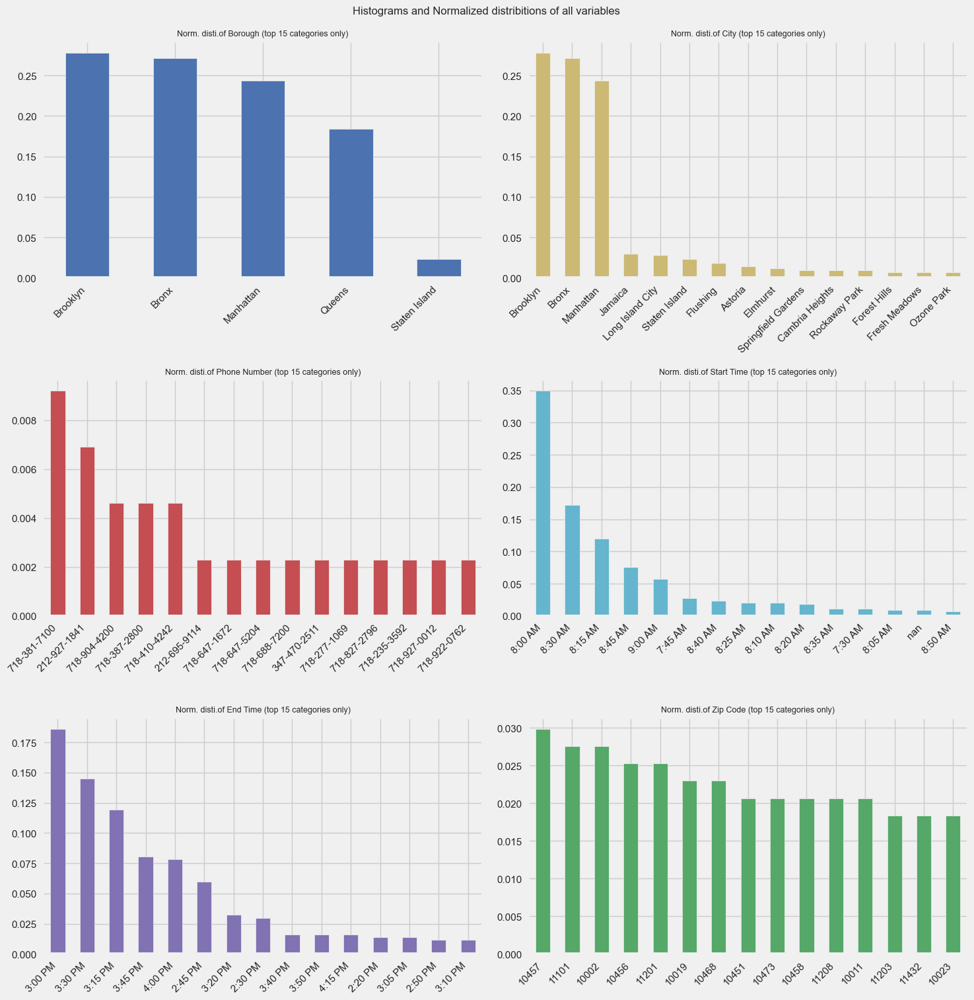

Could not draw Violin Plots


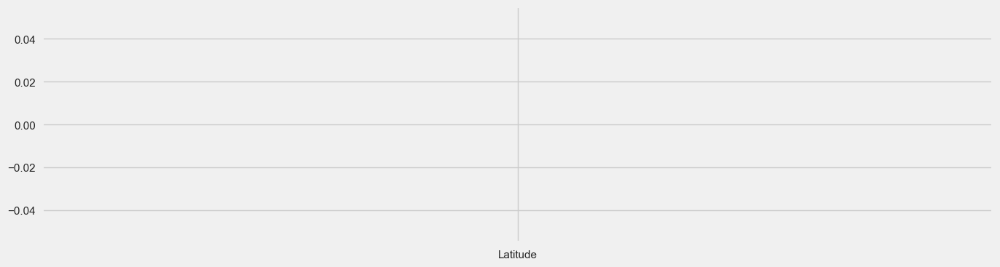

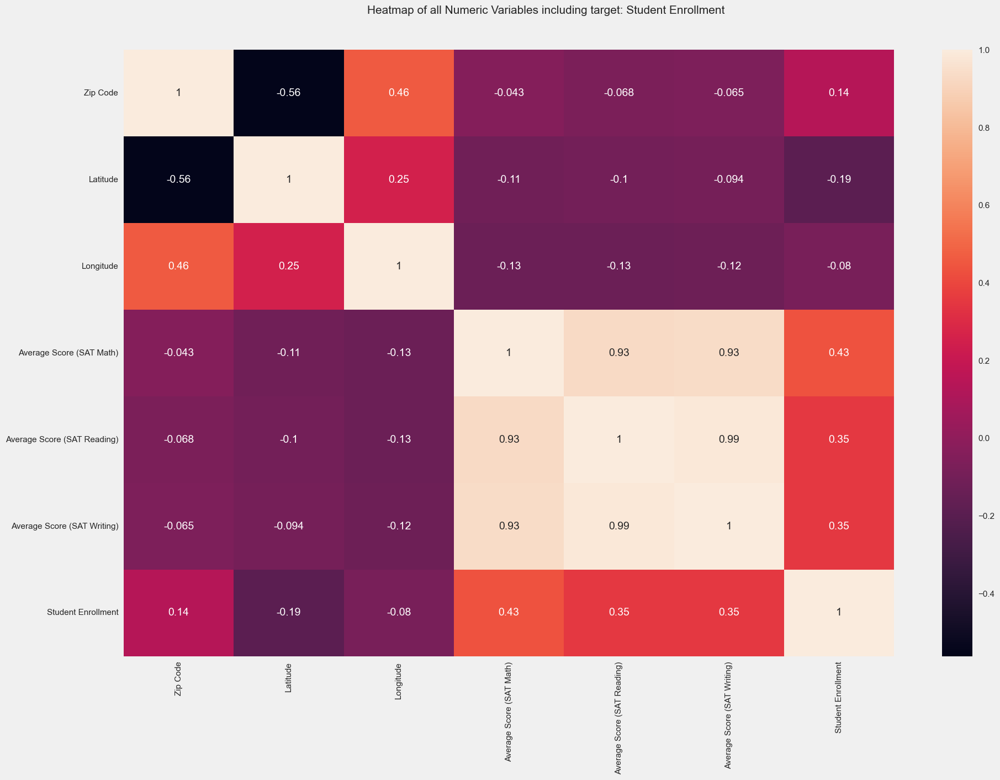

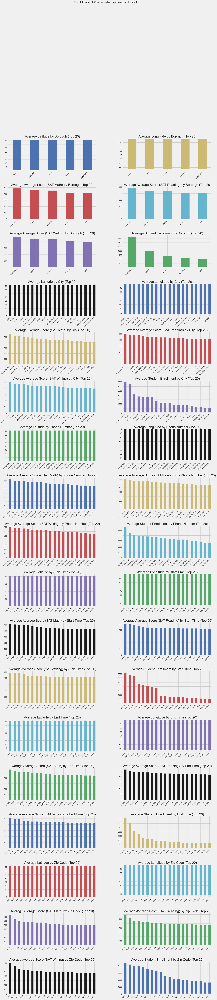

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /Users/mocha/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package name

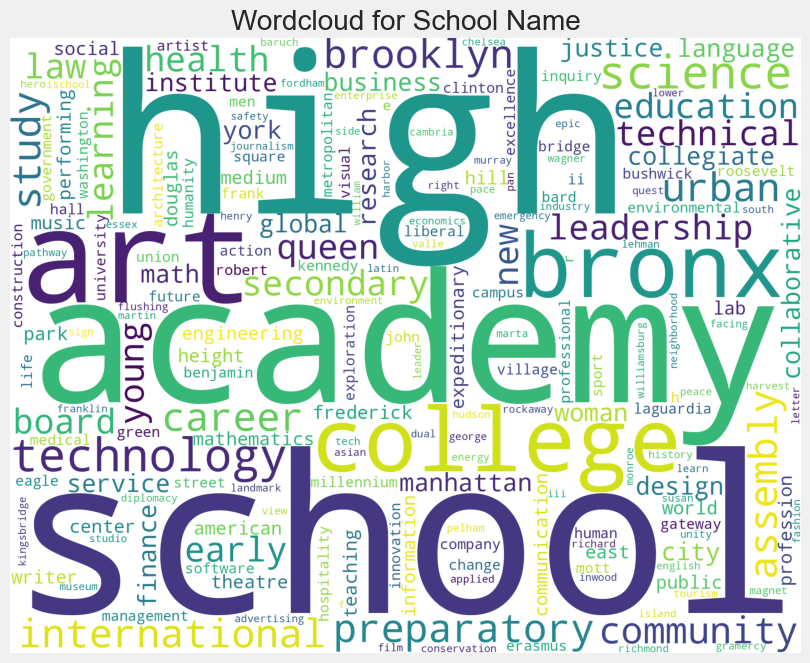

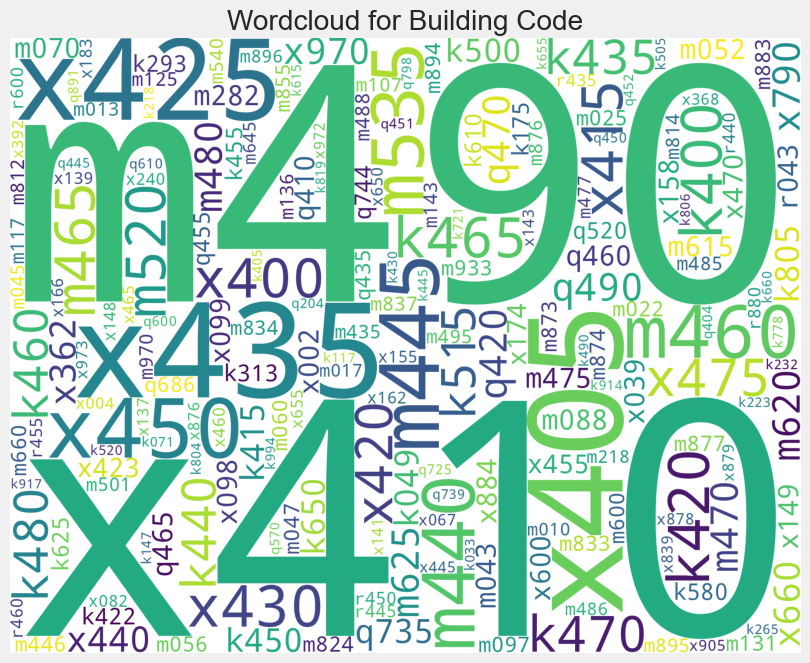

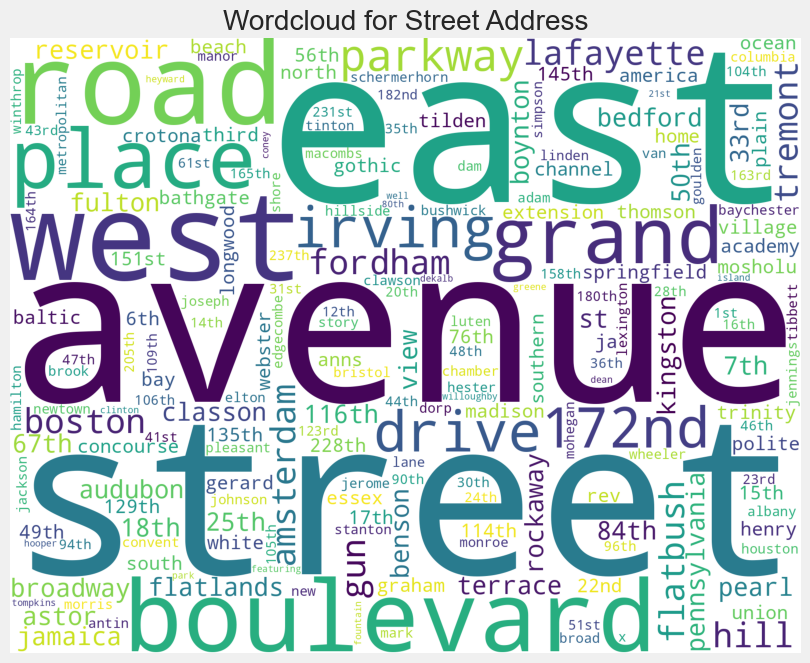

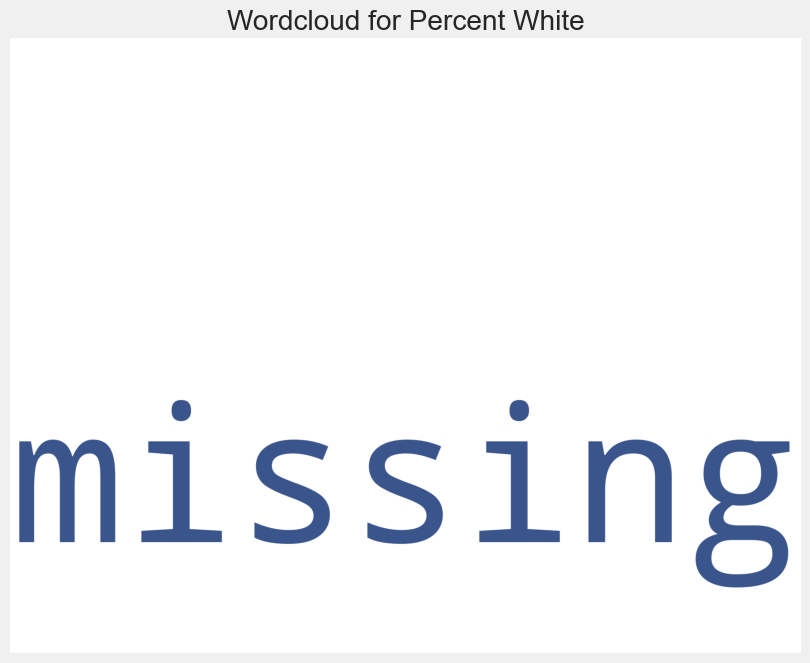

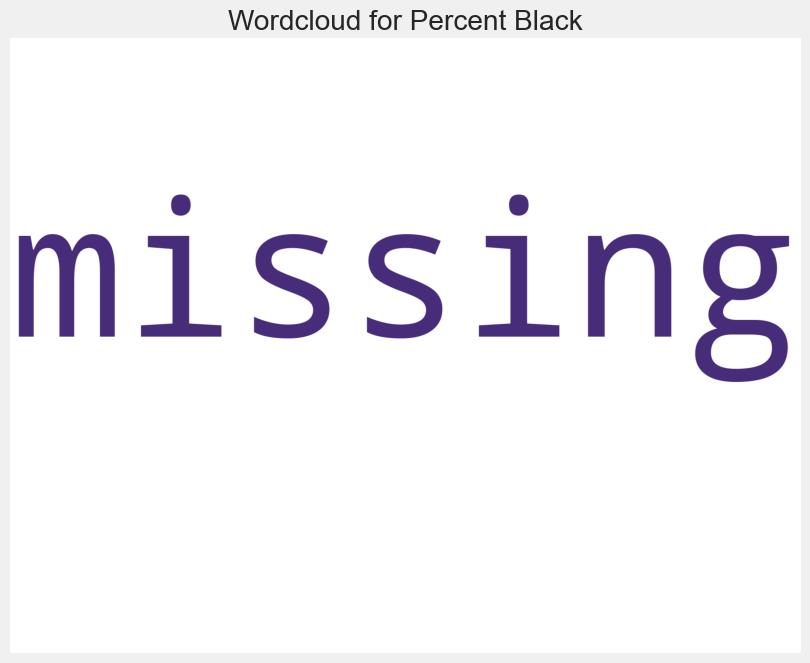

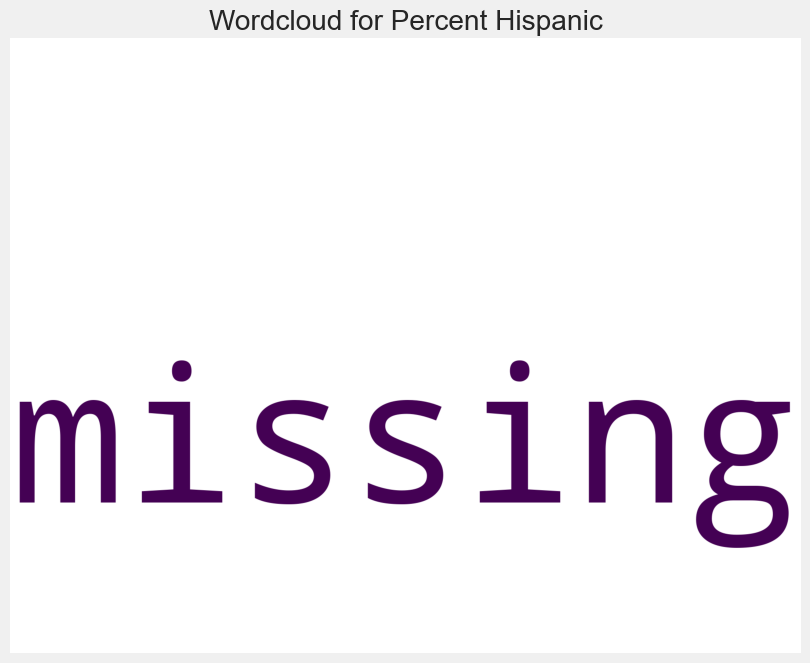

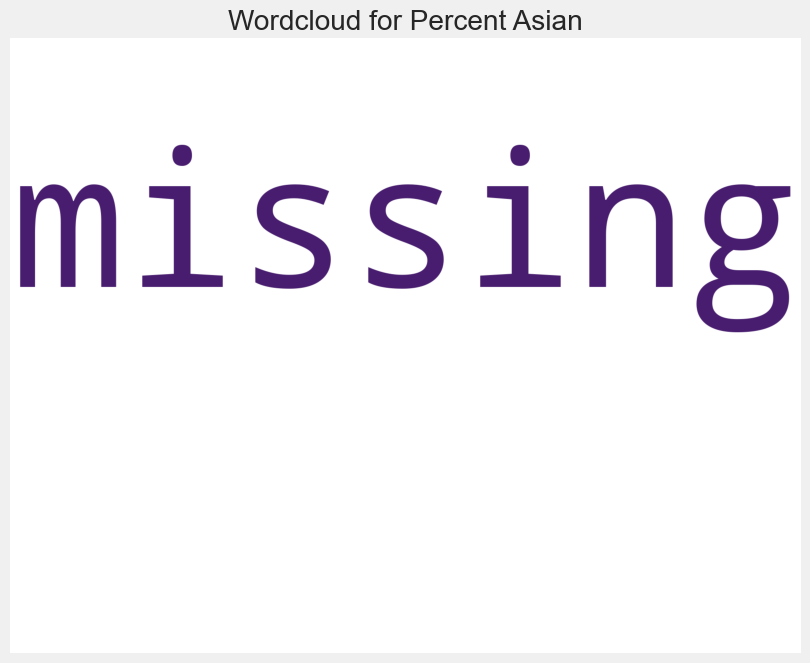

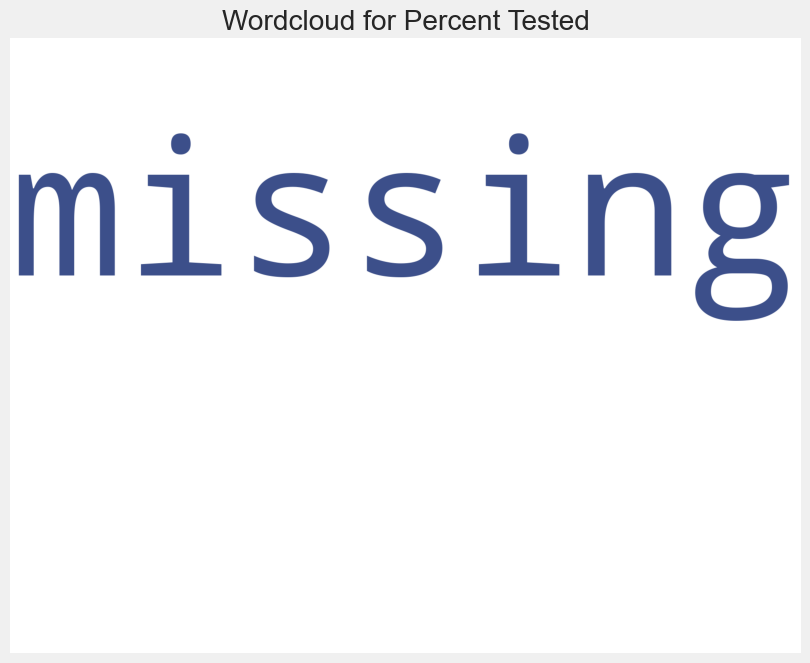

All Plots done
Time to run AutoViz = 86 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [24]:
# run the auto eda
nyc_sat_scores_viz = AV.AutoViz(
    filename='',
    sep=',',
    depVar='Student Enrollment',
    dfte=nyc_sat_scores,
    header=0,
    verbose=0,
    lowess=False,
    chart_format='svg',
    max_rows_analyzed=150000,
    max_cols_analyzed=30
)

## Assignment Part 3 - Apache Beam

c) Assignment 3 - Apache beam features - demonstrate apache beam in a colab including

composite transform, pipeline io, triggers, windowing ,pardo

You can useBeamML for exercise https://beam.apache.org/documentation/ml/about-ml/Links to an external site.

https://beam.apache.org/documentation/ml/overview/Links to an external site.

https://beam.apache.org/documentation/transforms/python/elementwise/runinference-sklearn/Links to an external site.



be creative in your solution - below is just an hint for you

Hint :

https://www.macrometa.com/event-stream-processing/apache-beam-tutorialLinks to an external site.

and https://colab.sandbox.google.com/drive/1qrqbpRpfMtwosjcZQ3_qAWvBCXtzs-8D?usp=sharing

Total marks : 25%